# Things For Experimentation

Here is a list of things that can be explored:

*   GRU layer
*   Bidirectional layer
*   Stacked layers
*   Conv1D layer
*   Dropout regularization
*   L1/L2 regularization
*   Train on more data
*   Cross validation
*   Hyperparameters tuning

# Load / Visualize Data

## Import appropriate Python modules

In [0]:
import tensorflow as tf

import pandas as pd

import numpy as np

import plotly.express as px

import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler

from google.colab import drive

from pathlib import Path

## Mount Google Drive

In [5]:
mount_directory_path = Path('/content/drive')

drive.mount(str(mount_directory_path), force_remount=True)

Mounted at /content/drive


## Load raw data

In [0]:
io_directory_path = mount_directory_path / 'My Drive' / 'multivariate-time-series-classification-using-deep-learning'

data_file_path = io_directory_path / 'garan.csv'

original_raw_data = pd.read_csv(data_file_path)

## Show data shape, columns, data types and some observations

In [0]:
print(original_raw_data.shape)

print(original_raw_data.dtypes)

display(original_raw_data)

(82998, 26)
trigger          object
exchangeTime     object
mid_price       float64
bidSize10         int64
bidSize9          int64
bidSize8          int64
bidSize7          int64
bidSize6          int64
bidSize5          int64
bidSize4          int64
bidSize3          int64
bidSize2          int64
bidSize1          int64
askSize1          int64
askSize2          int64
askSize3          int64
askSize4          int64
askSize5          int64
askSize6          int64
askSize7          int64
askSize8          int64
askSize9          int64
askSize10         int64
tradeSize         int64
tradePrice      float64
value             int64
dtype: object


,trigger,exchangeTime,mid_price,bidSize10,bidSize9,bidSize8,bidSize7,bidSize6,bidSize5,bidSize4,bidSize3,bidSize2,bidSize1,askSize1,askSize2,askSize3,askSize4,askSize5,askSize6,askSize7,askSize8,askSize9,askSize10,tradeSize,tradePrice,value
0,E,2018-10-31 10:00:00.095,7.175,31852,22203,58357,119133,25140,2,1295,31677,85041,102150,50000,137656,247481,80372,39875,10122,56688,80376,85922,50303,5219,7.18,0
1,E,2018-10-31 10:00:00.095,7.175,31852,22203,58357,119133,25140,2,1295,31677,85041,102150,36919,137656,247481,80372,39875,10122,56688,80376,85922,50303,13081,7.18,0
2,A,2018-10-31 10:00:00.096,7.175,31852,22203,58357,119133,25140,2,1295,31677,85041,102150,36919,137656,247481,80372,39875,25122,56688,80376,85922,50303,0,0.00,0
3,A,2018-10-31 10:00:00.096,7.175,31852,22203,58357,119133,25140,2,1295,31677,85041,102150,36919,137656,247481,80372,39875,25122,56688,95376,85922,50303,0,0.00,0
4,A,2018-10-31 10:00:00.096,7.175,31852,22203,58357,119133,25140,2,1295,31677,85041,102150,36919,137656,247481,80372,39875,25122,71688,95376,85922,50303,0,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82993,A,2018-10-31 17:59:59.664,6.945,456821,259339,284958,636777,505757,639100,346490,606056,290302,381759,88355,162149,283751,251738,267316,255395,377559,220200,102353,132466,0,0.00,0
82994,A,2018-10-31 17:59:59.710,6.945,456821,259339,284958,636777,505757,639100,346490,606056,290302,391759,88355,162149,283751,251738,267316,255395,377559,220200,102353,132466,0,0.00,0
82995,D,2018-10-31 17:59:59.713,6.945,456821,259339,284958,636777,505757,639100,346490,606056,289302,391759,88355,162149,283751,251738,267316,255395,377559,220200,102353,132466,0,0.00,0
82996,E,2018-10-31 17:59:59.713,6.945,456821,259339,284958,636777,505757,639100,346490,606056,289302,391759,87355,162149,283751,251738,267316,255395,377559,220200,102353,132466,1000,6.95,0


## Show classes ratios

In [0]:
print((original_raw_data['value'].value_counts(normalize=True) * 100).round(2).to_dict())

{0: 92.53, -1: 4.2, 1: 3.27}


## Display time-series columns as separate static plots

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f72fa30e3c8>,
      dtype=object)

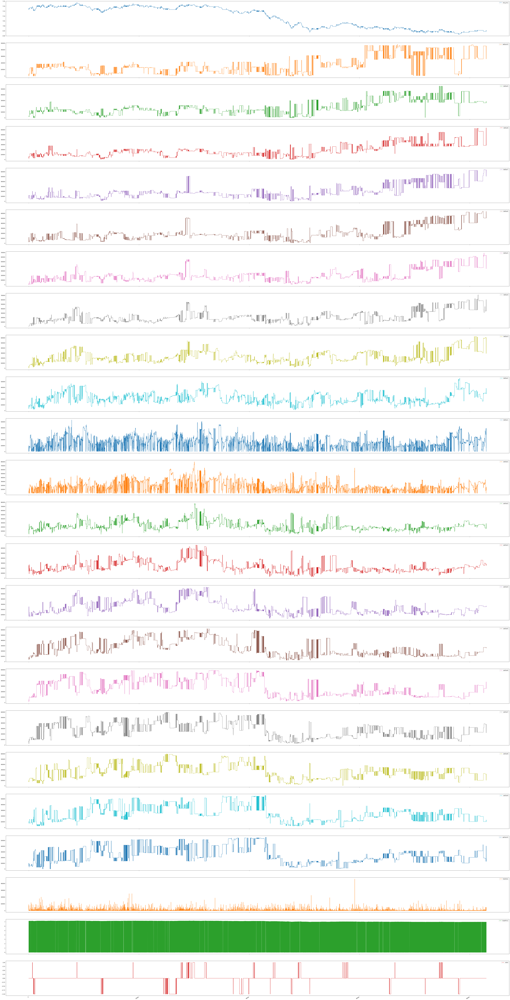

In [0]:
original_raw_data.plot(subplots=True, figsize=(80, 180))

## Display a specific time-series column as interactive plot

In [0]:
fig = px.line(original_raw_data, x = original_raw_data.index, y = 'mid_price')

fig.show()

# Prepare X, y from raw data

## Set RNG seed

In [0]:
RANDOM_SEED = 42

def set_random_seed(seed):
  np.random.seed(seed)

  tf.random.set_seed(seed)

set_random_seed(RANDOM_SEED)

## Remove unnecessary columns from data

In [0]:
temp_data = original_raw_data.copy()

columns_to_remove = [ 'exchangeTime' ]

temp_data.drop(columns=columns_to_remove, inplace=True)

## Create targets one-hot matrix

In [0]:
targets = temp_data.pop('value')

labels_mapping = dict(map(lambda o: (o[1], o[0]), enumerate(set(targets))))

labels_sorted = sorted(labels_mapping, key=labels_mapping.get)

targets.replace(labels_mapping, inplace=True)

targets = tf.keras.utils.to_categorical(targets)

print(f'Mapping between labels and unique numbers: {labels_mapping}')

print(f'Interpretation of one-hot columns: {labels_sorted}')

print(targets)

Mapping between labels and unique numbers: {0: 0, 1: 1, -1: 2}
Interpretation of one-hot columns: [0, 1, -1]
[[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 ...
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]]


## Create time-series processed features matrix

In [0]:
TRAIN_SPLIT = 50000

categorical_columns = [ 'trigger' ]

non_categorical_columns = set(temp_data.columns) - set(categorical_columns)

categorical_data = temp_data[categorical_columns]

non_categorical_data = temp_data[non_categorical_columns]

categorical_features = pd.get_dummies(categorical_data, prefix=categorical_columns, columns=categorical_columns)

scaler = StandardScaler()

scaler.fit(non_categorical_data[:TRAIN_SPLIT])

non_categorical_features = pd.DataFrame(scaler.transform(non_categorical_data), index = non_categorical_data.index, columns = non_categorical_data.columns)

time_series_processed = pd.merge(categorical_features, non_categorical_features, left_index=True, right_index=True)

display(time_series_processed)

,trigger_A,trigger_D,trigger_E,askSize7,askSize4,askSize2,bidSize8,tradeSize,tradePrice,bidSize9,askSize9,bidSize1,bidSize6,askSize1,askSize3,askSize5,bidSize10,bidSize3,bidSize5,bidSize7,bidSize2,askSize8,mid_price,bidSize4,askSize10,askSize6
0,0,0,1,-1.784557,-1.344883,-0.970174,-1.044890,0.474718,1.366167,-1.622692,-1.307651,-0.507645,-1.475653,-1.092837,-0.082197,-1.784404,-1.113979,-1.802944,-1.824960,-0.105207,-1.362782,-1.543324,0.197733,-1.964876,-1.574752,-2.126025
1,0,0,1,-1.784557,-1.344883,-0.970174,-1.044890,1.519855,1.366167,-1.622692,-1.307651,-0.507645,-1.475653,-1.186022,-0.082197,-1.784404,-1.113979,-1.802944,-1.824960,-0.105207,-1.362782,-1.543324,0.197733,-1.964876,-1.574752,-2.126025
2,1,0,0,-1.784557,-1.344883,-0.970174,-1.044890,-0.219072,-0.734829,-1.622692,-1.307651,-0.507645,-1.475653,-1.186022,-0.082197,-1.784404,-1.113979,-1.802944,-1.824960,-0.105207,-1.362782,-1.543324,0.197733,-1.964876,-1.574752,-2.028757
3,1,0,0,-1.784557,-1.344883,-0.970174,-1.044890,-0.219072,-0.734829,-1.622692,-1.307651,-0.507645,-1.475653,-1.186022,-0.082197,-1.784404,-1.113979,-1.802944,-1.824960,-0.105207,-1.362782,-1.437134,0.197733,-1.964876,-1.574752,-2.028757
4,1,0,0,-1.682537,-1.344883,-0.970174,-1.044890,-0.219072,-0.734829,-1.622692,-1.307651,-0.507645,-1.475653,-1.186022,-0.082197,-1.784404,-1.113979,-1.802944,-1.824960,-0.105207,-1.362782,-1.437134,0.197733,-1.964876,-1.574752,-2.028757
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82993,1,0,0,0.397810,-0.155099,-0.762753,2.886463,-0.219072,-0.734829,2.436861,-1.196167,2.226532,4.711191,-0.819606,0.202926,-0.285386,5.798048,4.429014,5.876969,7.522483,0.730421,-0.553466,-4.018436,1.981721,-1.039566,-0.535547
82994,1,0,0,0.397810,-0.155099,-0.762753,2.886463,-0.219072,-0.734829,2.436861,-1.196167,2.324318,4.711191,-0.819606,0.202926,-0.285386,5.798048,4.429014,5.876969,7.522483,0.730421,-0.553466,-4.018436,1.981721,-1.039566,-0.535547
82995,0,1,0,0.397810,-0.155099,-0.762753,2.886463,-0.219072,-0.734829,2.436861,-1.196167,2.324318,4.711191,-0.819606,0.202926,-0.285386,5.798048,4.429014,5.876969,7.522483,0.720223,-0.553466,-4.018436,1.981721,-1.039566,-0.535547
82996,0,0,1,0.397810,-0.155099,-0.762753,2.886463,-0.086136,1.298865,2.436861,-1.196167,2.324318,4.711191,-0.826730,0.202926,-0.285386,5.798048,4.429014,5.876969,7.522483,0.720223,-0.553466,-4.018436,1.981721,-1.039566,-0.535547


## Create X, y windowed data

In [0]:
WINDOW_SIZE = 50

def windowed_data(sequence, targets, window_size):
	X, y = list(), list()

	for i in range(len(sequence)):
		end_index = i + window_size

		if end_index > len(sequence): break

		seq_x, seq_y = sequence[i:end_index], targets[end_index - 1]

		X.append(seq_x)
		y.append(seq_y)

	return np.array(X), np.array(y)

X, y = windowed_data(time_series_processed.values, targets, WINDOW_SIZE)

## Display X, y shapes as well as first and last windowed examples

In [0]:
print(f"Shape of X: {X.shape}")

print(f"Shape of y: {y.shape}")

print(f"First example has targets {y[0]} and window:")

print(X[0])

print(f"Last example has targets {y[-1]} and window:")

print(X[-1])

Shape of X: (82949, 50, 26)
Shape of y: (82949, 3)
First example has targets [1. 0. 0.] and window:
[[ 0.          0.          1.         ... -1.96487578 -1.57475222
  -2.12602475]
 [ 0.          0.          1.         ... -1.96487578 -1.57475222
  -2.12602475]
 [ 1.          0.          0.         ... -1.96487578 -1.57475222
  -2.02875695]
 ...
 [ 1.          0.          0.         ... -1.9110609  -1.24503454
  -1.83582302]
 [ 0.          0.          1.         ... -1.9110609  -1.47704651
  -2.04496825]
 [ 0.          0.          1.         ... -1.9110609  -1.47704651
  -2.04496825]]
Last example has targets [1. 0. 0.] and window:
[[ 1.          0.          0.         ...  1.98172056 -1.03956595
  -0.53554704]
 [ 0.          0.          1.         ...  1.98172056 -1.03956595
  -0.53554704]
 [ 0.          0.          1.         ...  1.98172056 -1.03956595
  -0.53554704]
 ...
 [ 0.          1.          0.         ...  1.98172056 -1.03956595
  -0.53554704]
 [ 0.          0.          1.  

## Split X, y to train and test sets

In [0]:
X_train, X_val, y_train, y_val = X[:TRAIN_SPLIT], X[TRAIN_SPLIT:], y[:TRAIN_SPLIT], y[TRAIN_SPLIT:]

## Display training, validation shapes as well as examples in the split point

In [0]:
print(f"Shape of training X: {X_train.shape}")
print(f"Shape of training y: {y_train.shape}")

print(f"Last training example has targets {y_train[-1]} and window:")

print(X_train[-1])

print(f"Shape of validation X: {X_val.shape}")
print(f"Shape of validation y: {y_val.shape}")

print(f"First validation example has targets {y_val[0]} and window:")

print(X_val[0])

Shape of training X: (50000, 50, 26)
Shape of training y: (50000, 3)
Last training example has targets [1. 0. 0.] and window:
[[ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 [ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 [ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 ...
 [ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 [ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 [ 1.          0.          0.         ...  0.4106392  -1.60430494
  -1.37753605]]
Shape of validation X: (32949, 50, 26)
Shape of validation y: (32949, 3)
First validation example has targets [1. 0. 0.] and window:
[[ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 [ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 [ 0.          0.          1.         ...  0.4106392  -1.60430494
  -1.37753605]
 ...
 

## Validate continuity of last training and first validation data window

In [0]:
assert ((X_train[-1][-(WINDOW_SIZE-1):])==(X_val[0][:(WINDOW_SIZE-1)])).all() == True

## Training, Validation, Prediction generators

In [0]:
BATCH_SIZE = 128

SHUFFLE_BUFFER_SIZE = 10000

def training_generator (X, y, batch_size, shuffle_buffer_size):
  dataset = tf.data.Dataset.from_tensor_slices((X, y))
  dataset = dataset.cache().shuffle(shuffle_buffer_size).batch(batch_size)
  return dataset

def validation_generator (X, y, batch_size):
  dataset = tf.data.Dataset.from_tensor_slices((X, y))
  dataset = dataset.batch(batch_size)
  return dataset

def prediction_generator (X, y, batch_size):
  dataset = tf.data.Dataset.from_tensor_slices((X, y))
  dataset = dataset.batch(batch_size)
  return dataset

train_generator = training_generator(X_train, y_train, BATCH_SIZE, SHUFFLE_BUFFER_SIZE)

val_generator = validation_generator(X_val, y_val, BATCH_SIZE)

predict_generator = prediction_generator(X, y, BATCH_SIZE)

# Modelling

## Create model architecture

In [0]:
tf.keras.backend.clear_session()

model = tf.keras.models.Sequential([
  tf.keras.layers.LSTM(256, input_shape=X_train.shape[-2:]),
  tf.keras.layers.Dropout(0.4),
  tf.keras.layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l1_l2()),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(64, activation='relu', kernel_regularizer=tf.keras.regularizers.l1_l2()),
  tf.keras.layers.Dropout(0.3),
  tf.keras.layers.Dense(y_train.shape[1], activation='softmax')
])

print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 256)               289792    
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense (Dense)                (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 1

## Compile / Train model

In [0]:
EPOCHS = 20

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics='accuracy')

training_history = model.fit(train_generator, epochs=EPOCHS, validation_data=val_generator)

Epoch 1/20
391/391 [==============================] - 12s 30ms/step - loss: 4.1530 - accuracy: 0.8979 - val_loss: 0.3954 - val_accuracy: 0.9575
Epoch 2/20
391/391 [==============================] - 11s 29ms/step - loss: 0.3937 - accuracy: 0.9039 - val_loss: 0.4551 - val_accuracy: 0.9575
Epoch 3/20
391/391 [==============================] - 11s 29ms/step - loss: 0.3483 - accuracy: 0.9039 - val_loss: 0.3746 - val_accuracy: 0.9575
Epoch 4/20
391/391 [==============================] - 11s 29ms/step - loss: 0.3526 - accuracy: 0.9040 - val_loss: 0.3810 - val_accuracy: 0.9575
Epoch 5/20
391/391 [==============================] - 11s 29ms/step - loss: 0.3054 - accuracy: 0.9116 - val_loss: 0.3921 - val_accuracy: 0.9575
Epoch 6/20
391/391 [==============================] - 11s 29ms/step - loss: 0.3062 - accuracy: 0.9155 - val_loss: 0.4116 - val_accuracy: 0.9575
Epoch 7/20
391/391 [==============================] - 11s 29ms/step - loss: 0.2883 - accuracy: 0.9238 - val_loss: 0.4365 - val_accuracy:

## Display plots of training history of loss and metrics

In [0]:
def plot_training_validation_curves(training_history, metric_key):
  train_values = training_history[metric_key]

  val_values = training_history[f'val_{metric_key}']

  epochs = list(range(len(train_values)))

  fig = go.Figure()

  fig.add_trace(go.Scatter(x=epochs, y=train_values, mode='lines+markers', name=metric_key))

  fig.add_trace(go.Scatter(x=epochs, y=val_values, mode='lines+markers', name=f'val_{metric_key}'))

  fig.update_layout(title=f'Training & Validation performance for {metric_key} metric', xaxis_title='# of epochs', yaxis_title=metric_key)

  fig.show()

plot_training_validation_curves(training_history.history, 'loss')

plot_training_validation_curves(training_history.history, 'accuracy')

## Evaluate model on training and validation data

In [0]:
validation_loss, validation_accuracy = model.evaluate(val_generator, verbose = 0)

print(f'Validation loss: {validation_loss:.4}')
print(f'Validation accuracy: {validation_accuracy:.2}%')

training_loss, training_accuracy = model.evaluate(train_generator, verbose = 0)

print(f'Training loss: {training_loss:.4}')
print(f'Training accuracy: {training_accuracy:.2}%')

Validation loss: 0.5263
Validation accuracy: 0.96%
Training loss: 0.2036
Training accuracy: 0.96%


## Predict all time-series examples and save probabilities

In [0]:
predicted_probs = model.predict(predict_generator, verbose = 0)

probs_dataframe = pd.DataFrame(predicted_probs, columns=labels_sorted)

probs_dataframe.to_csv(io_directory_path / 'probabilities_output.csv', index = False)

display(probs_dataframe)

,0,1,-1
0,0.247795,0.335568,0.416637
1,0.247789,0.335570,0.416640
2,0.247803,0.335566,0.416632
3,0.252556,0.333679,0.413765
4,0.267931,0.327708,0.404361
...,...,...,...
82944,0.999453,0.000323,0.000224
82945,0.999470,0.000314,0.000216
82946,0.999544,0.000271,0.000185
82947,0.999573,0.000254,0.000173


## Display plot of probabilities for each example

In [0]:
def plot_predicted_probabilities(dataframe):
  fig = go.Figure()

  for (column_name, column_data) in dataframe.iteritems():
    fig.add_trace(go.Scatter(x=dataframe.index, y=column_data.values, mode='lines', name=column_name))

  fig.update_layout(title=f'Class probabilities for time-series indexes', xaxis_title='time-series index', yaxis_title='class probability')

  fig.show()

plot_predicted_probabilities(probs_dataframe)